# Pipeline para video analítico - Seguimiento de objetos

- La salida del detector de objetos es un BB para cada frame.
- ¿Cómo asociar cada BB del frame i al BB del frame (i-1) para representar la trayectoria de un objeto?
    - Definir el costo de asociar cada nueva detección a la anterior.
        - Usar Kalman para estimar posición y velocidad en el frame i de cada objeto detectado anteriormente. 
    - Distancia de features (con extractor)        
    - Costo compuesto de las dos anteriores.

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

from videoanalytics.pipeline import process_pipeline, Source, Sink

Inicialización de Tensorflow (requerida para detector y extractor de features).

In [2]:
# comment out below line to enable tensorflow logging outputs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

## Bloques en desarrollo

In [3]:
class MatplotlibVisualizer(Sink):
    def __init__(self, context,n_frames_per_col=2,w=22,h=4):
        super().__init__(context)
        self.n_frames_per_col = n_frames_per_col        
        self.w=w
        self.h=h
        
    def setup(self):        
        n_frames = self.context["TOTAL_FRAMES"]
        assert(n_frames<64)
        
        self.frame_counter = self.context["START_FRAME"]
        
        n_rows = int(n_frames/self.n_frames_per_col)
        self.fig,self.axes = plt.subplots(n_rows,self.n_frames_per_col,figsize=(self.w,n_rows*self.h),
                                          squeeze=False)
            
    def process(self):
        ix = int(self.frame_counter%self.n_frames_per_col)
        iy = int(self.frame_counter/self.n_frames_per_col)
        self.axes[iy][ix].imshow(self.context['FRAME'], interpolation='nearest', aspect='auto')
        self.axes[iy][ix].set_title("Frame %d"% self.frame_counter)
        self.frame_counter+=1
            
    def shutdown(self):        
        plt.tight_layout()        

## Definición y ejecución de pipelines

Definición de grafos y ejecución.

In [4]:
import networkx as nx
from videoanalytics.pipeline.sources import VideoReader
from videoanalytics.pipeline.sinks import VideoWriter
from videoanalytics.pipeline.sinks.yolo4_detector import YOLOv4Detector
from videoanalytics.pipeline.sinks.obj_detector import DetectionsAnnotator, DetectionsCSVWriter, ObjectDetectorCSV

### Pipeline que usa detecciones precalculadas

Start frame: 0
Total frames frame: 4


  0%|          | 0/4 [00:00<?, ?it/s]

Initializing pipeline
Sequence: ['input', 'detector', 'detector-annot', 'inspector1']
Processing pipeline
Shutting down pipeline


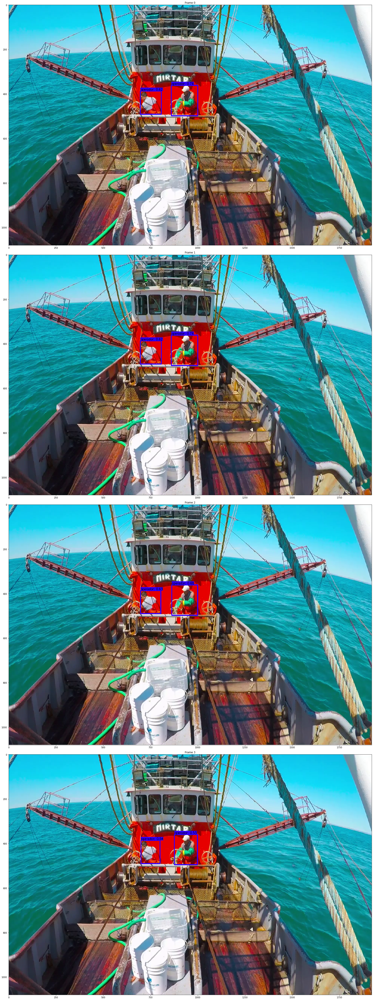

In [11]:
# Input
INPUT_VIDEO = "../data/video/barco.mp4"
START_FRAME = 0
MAX_FRAMES = 4

# Detector
CSV_DETECTIONS_FILENAME = "detections.csv"

# Detections Annotator
DETECTOR_CLASSES_FILENAME = "../data/classes/coco.names"

# Output
OUTPUT_VIDEO = "../outputs/prueba.mp4"

# 1. Crear el contexto en el que los bloques comparten información
context = {}

# 2. Instanciar la pipeline (grafo dirigido)
pipeline = nx.DiGraph()

# 3. Agregar bloques
pipeline.add_nodes_from([
    ( "input", {
      "component": VideoReader(context,
                                 video_path=INPUT_VIDEO,
                                 start_frame=START_FRAME,
                                 max_frames=MAX_FRAMES)
    }),
    
    ( "detector", {
      "component": ObjectDetectorCSV(context,CSV_DETECTIONS_FILENAME)
    }),
    
    ( "detector-annot", {
      "component": DetectionsAnnotator(context,class_names_filename=DETECTOR_CLASSES_FILENAME)
    }),    
        
    ( "inspector1", {
      "component": MatplotlibVisualizer(context,n_frames_per_col=1,w=24,h=16)
    }),
    
    #( "writer", {
    #  "component": VideoWriter(context,filename=OUTPUT_VIDEO)
    #})
])

# 4. Definir conexiones
pipeline.add_edges_from([
    ("input", "detector"), 
    ("detector", "detector-annot"), 
    ("detector-annot", "inspector1")
])

# 5. Eliminar bloques aislados
pipeline.remove_nodes_from(list(nx.isolates(pipeline)))

# 6. Procesar
process_pipeline(pipeline,context)

Cierre de sesión de tensorflow.

In [ ]:
session.close()

In [12]:
def load_detections_csv(filename,fps=29.0):
    det_columns = ["frame_num","class_idx", "x","y","w","h","score"]
    df = pd.read_csv(filename,names=det_columns)
    
    # Tiempo relativo
    df['ts'] = df['frame_num']/fps
    df['ts'] = pd.to_timedelta(df['ts'], unit='s')

    # Centrado de coordenadas de BBs
    df['xc'] = df['x']+df['w']/2
    df['yc'] = df['y']+df['h']/2

    # Área de los BBs
    df['area'] = df['w']*df['h']
    
    return df
df_det = load_detections_csv("detections.csv")
df_det.head()

,frame_num,class_idx,x,y,w,h,score,ts,xc,yc,area
0,0,0,860.0,361.0,140.0,137.0,0.742915,0 days 00:00:00,930.0,429.5,19180.0
1,0,0,696.0,387.0,111.0,104.0,0.620522,0 days 00:00:00,751.5,439.0,11544.0
2,1,0,860.0,361.0,140.0,137.0,0.742915,0 days 00:00:00.034482759,930.0,429.5,19180.0
3,1,0,696.0,387.0,111.0,104.0,0.620522,0 days 00:00:00.034482759,751.5,439.0,11544.0
4,2,0,862.0,361.0,137.0,137.0,0.657860,0 days 00:00:00.068965517,930.5,429.5,18769.0


## Pruebas